# Preprocess dataset

In [ ]:
!pip install tsmoothie

In [ ]:
import pandas as pd
import numpy as np
from google.colab import drive
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, GRU, Dropout, RepeatVector, TimeDistributed
from keras.layers import Input, Dense, Lambda
from keras.models import Model
from keras.objectives import binary_crossentropy
from keras.callbacks import LearningRateScheduler
import keras.backend as K

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

from tsmoothie.smoother import ExponentialSmoother
import plotly.graph_objects as go

In [ ]:
# load dfset
drive.mount('/drive')   #mount the drive to load 

Drive already mounted at /drive; to attempt to forcibly remount, call drive.mount("/drive", force_remount=True).


In [ ]:
PATH_DATA = '.../EURUSD1.csv'

data = pd.read_csv(PATH_DATA, names=['Date', 'Time', 'Open', 'High', 'Low', 'Close', 'Volume'])
data

,Date,Time,Open,High,Low,Close,Volume
0,2004.07.29,08:53,1.20270,1.20300,1.20220,1.20230,10
1,2004.07.29,08:54,1.20270,1.20280,1.20210,1.20220,9
2,2004.07.29,08:55,1.20260,1.20290,1.20230,1.20270,9
3,2004.07.29,08:56,1.20240,1.20260,1.20210,1.20230,9
4,2004.07.29,08:57,1.20220,1.20260,1.20170,1.20230,12
...,...,...,...,...,...,...,...
6001881,2021.01.28,20:30,1.21291,1.21302,1.21289,1.21295,72
6001882,2021.01.28,20:31,1.21297,1.21299,1.21289,1.21292,35
6001883,2021.01.28,20:32,1.21291,1.21291,1.21283,1.21283,22
6001884,2021.01.28,20:33,1.21284,1.21288,1.21269,1.21271,78


In [ ]:
# Merge date and time into one column and convert its datatype into datatime
data['Datetime'] = pd.to_datetime(data['Date'] + ' ' + data['Time'])
data = data.drop(columns=['Date', 'Time'])
data = data[['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume']]
data['Volume'] = data['Volume'].astype('float')
data

,Datetime,Open,High,Low,Close,Volume
0,2004-07-29 08:53:00,1.20270,1.20300,1.20220,1.20230,10.0
1,2004-07-29 08:54:00,1.20270,1.20280,1.20210,1.20220,9.0
2,2004-07-29 08:55:00,1.20260,1.20290,1.20230,1.20270,9.0
3,2004-07-29 08:56:00,1.20240,1.20260,1.20210,1.20230,9.0
4,2004-07-29 08:57:00,1.20220,1.20260,1.20170,1.20230,12.0
...,...,...,...,...,...,...
6001881,2021-01-28 20:30:00,1.21291,1.21302,1.21289,1.21295,72.0
6001882,2021-01-28 20:31:00,1.21297,1.21299,1.21289,1.21292,35.0
6001883,2021-01-28 20:32:00,1.21291,1.21291,1.21283,1.21283,22.0
6001884,2021-01-28 20:33:00,1.21284,1.21288,1.21269,1.21271,78.0


In [ ]:
# Use an subset of data 
START_DATE = '2010-01-01'
END_DATE = '2011-01-01'
data = data.loc[(data['Datetime'] >= START_DATE) & (data['Datetime'] <= END_DATE)]
data

,Datetime,Open,High,Low,Close,Volume
1902994,2010-01-03 23:00:00,1.43259,1.43259,1.43213,1.43222,28.0
1902995,2010-01-03 23:01:00,1.43227,1.43242,1.43223,1.43241,12.0
1902996,2010-01-03 23:02:00,1.43234,1.43244,1.43231,1.43235,22.0
1902997,2010-01-03 23:03:00,1.43236,1.43237,1.43231,1.43231,5.0
1902998,2010-01-03 23:04:00,1.43232,1.43235,1.43225,1.43235,14.0
...,...,...,...,...,...,...
2270113,2010-12-31 21:43:00,1.33813,1.33887,1.33805,1.33805,10.0
2270114,2010-12-31 21:44:00,1.33848,1.33849,1.33843,1.33843,4.0
2270115,2010-12-31 21:45:00,1.33803,1.33863,1.33801,1.33816,11.0
2270116,2010-12-31 21:46:00,1.33795,1.33867,1.33794,1.33833,6.0


In [ ]:
# Split data into train and test
# 80% Training : 20% Test
TRAIN_TEST_RATIO = 0.8
TRAIN_TEST_INDEX = int(data.shape[0] * TRAIN_TEST_RATIO)
TRAIN_TEST_INDEX

train, test = data.iloc[0:TRAIN_TEST_INDEX], data.iloc[TRAIN_TEST_INDEX:]
print('train shape: {}'.format(train.shape))
print('test shape: {}'.format(test.shape))

train shape: (293699, 6)
test shape: (73425, 6)


In [ ]:
scaler = StandardScaler().fit(train[['Close']])
train['Close'] = scaler.transform(train[['Close']])
test['Close'] = scaler.transform(test[['Close']])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
TIME_STEPS = 30

def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

X_train, y_train = create_dataset(train[['Close']], train[['Close']], TIME_STEPS)
print('X_train shape: {}'.format(X_train.shape))
print('y_train shape: {}'.format(y_train.shape))

X_train shape: (293669, 30, 1)
y_train shape: (293669, 1)


In [ ]:
X_test, y_test = create_dataset(test[['Close']], test[['Close']], TIME_STEPS)
print('X_test shape: {}'.format(X_test.shape))
print('y_test shape: {}'.format(y_test.shape))

X_test shape: (73395, 30, 1)
y_test shape: (73395, 1)


# Load models
*   LSTM with autoencoder
*   GRU with autoencoder
*   Variational autoencoder



## LSTM with autoencoder

In [ ]:
# Load the model
PATH_LSTM_MODEL = '.../model_lstm_autoencoder'
model_lstm = tf.keras.models.load_model(PATH_LSTM_MODEL)
model_lstm.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 64)                16896     
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
repeat_vector (RepeatVector) (None, 30, 64)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 30, 64)            33024     
_________________________________________________________________
dropout_1 (Dropout)          (None, 30, 64)            0         
_________________________________________________________________
time_distributed (TimeDistri (None, 30, 1)             65        
Total params: 49,985
Trainable params: 49,985
Non-trainable params: 0
____________________________________________________

In [ ]:
model_lstm.evaluate(X_test, y_test)

2294/2294 [==============================] - 25s 11ms/step - loss: 0.4165


0.4164971113204956

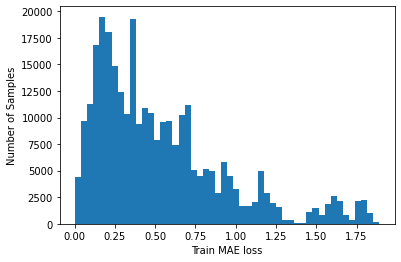

In [ ]:
X_train_pred = model_lstm.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

In [ ]:
threshold_static_lstm = np.percentile(train_mae_loss, 90) 
print(f'Reconstruction error threshold: {threshold_static_lstm}')

Reconstruction error threshold: 1.1280082229893924


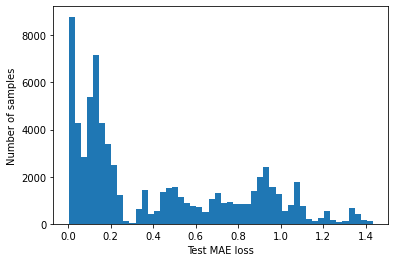

In [ ]:
X_test_pred = model_lstm.predict(X_test, verbose=0)
test_mae_loss_lstm = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss_lstm, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

# GRU with autoencoder

In [ ]:
# Load the model
PATH_GRU_MODEL = '.../model_gru_autoencoder'
model_gru = tf.keras.models.load_model(PATH_GRU_MODEL)
model_gru.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru (GRU)                    (None, 64)                12864     
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
repeat_vector (RepeatVector) (None, 30, 64)            0         
_________________________________________________________________
gru_1 (GRU)                  (None, 30, 64)            24960     
_________________________________________________________________
dropout_1 (Dropout)          (None, 30, 64)            0         
_________________________________________________________________
time_distributed (TimeDistri (None, 30, 1)             65        
Total params: 37,889
Trainable params: 37,889
Non-trainable params: 0
____________________________________________________

In [ ]:
model_gru.evaluate(X_test, y_test)

2294/2294 [==============================] - 22s 9ms/step - loss: 0.1800


0.1799873560667038

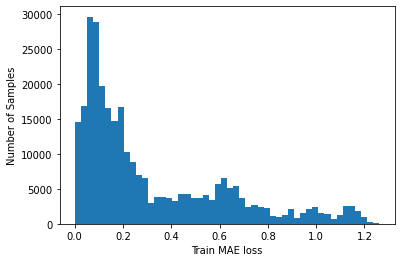

In [ ]:
X_train_pred = model_gru.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

In [ ]:
threshold_static_gru = np.percentile(train_mae_loss, 90) 
print(f'Reconstruction error threshold: {threshold_static_gru}')

Reconstruction error threshold: 0.766971306063895


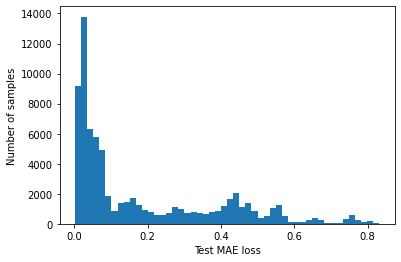

In [ ]:
X_test_pred = model_gru.predict(X_test, verbose=0)
test_mae_loss_gru = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss_gru, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

# Variational autoencoder

In [ ]:
# encoder
latent_dim = 2
inter_dim = 32

def sampling(args):
    z_mean, z_log_sigma = args
    batch_size = tf.shape(z_mean)[0] 
    epsilon = K.random_normal(shape=(batch_size, latent_dim), mean=0., stddev=1.)
    return z_mean + z_log_sigma * epsilon

# timesteps, features
timesteps = TIME_STEPS
features = X_train.shape[2]
input_x = Input(shape= (timesteps, features)) 

#intermediate dimension 
h = LSTM(inter_dim)(input_x)

#z_layer
z_mean = Dense(latent_dim)(h)
z_log_sigma = Dense(latent_dim)(h)
z = Lambda(sampling)([z_mean, z_log_sigma])

# Reconstruction decoder
decoder1 = RepeatVector(timesteps)(z)
decoder1 = LSTM(100, activation='relu', return_sequences=True)(decoder1)
decoder1 = TimeDistributed(Dense(features))(decoder1)

def vae_loss2(input_x, decoder1, z_log_sigma, z_mean):
    """ Calculate loss = reconstruction loss + KL loss for each data in minibatch """
    # E[log P(X|z)]
    recon = K.sum(K.binary_crossentropy(input_x, decoder1))
    # D_KL(Q(z|X) || P(z|X)); calculate in closed form as both dist. are Gaussian
    kl = 0.5 * K.sum(K.exp(z_log_sigma) + K.square(z_mean) - 1. - z_log_sigma)

    return recon + kl

In [ ]:
# Load the model
PATH_VAE_MODEL = '.../model_var_autoencoder'
model_vae = tf.keras.models.load_model(PATH_VAE_MODEL)
model_vae.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 30, 1)]      0                                            
__________________________________________________________________________________________________
lstm_2 (LSTM)                   (None, 32)           4352        input_2[0][0]                    
__________________________________________________________________________________________________
dense_3 (Dense)                 (None, 2)            66          lstm_2[0][0]                     
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 2)            66          lstm_2[0][0]                     
____________________________________________________________________________________________

In [ ]:
model_vae.evaluate(X_test, X_test)

2294/2294 [==============================] - 27s 12ms/step - loss: -885.3763


-885.3762817382812

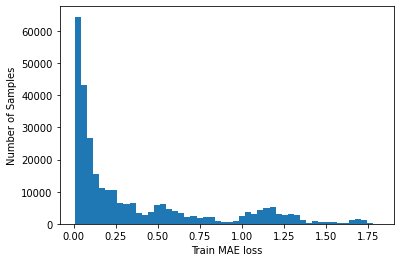

In [ ]:
X_train_pred = model_vae.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

In [ ]:
threshold_static_vae = np.percentile(train_mae_loss, 90) 
print(f'Reconstruction error threshold: {threshold_static_vae}')

Reconstruction error threshold: 1.1419609988472186


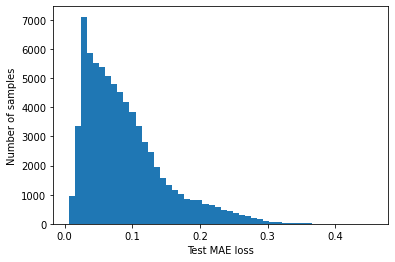

In [ ]:
X_test_pred = model_vae.predict(X_test, verbose=0)
test_mae_loss_vae = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss_vae, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

# Plot anomalies using static thresholds

In [ ]:
test_score_df = pd.DataFrame(test[TIME_STEPS:])
test_score_df['Close'] = test[TIME_STEPS:]['Close']
test_score_df['Loss_LSTM'] = test_mae_loss_lstm
test_score_df['Loss_GRU'] = test_mae_loss_gru
test_score_df['Loss_VAE'] = test_mae_loss_vae
test_score_df['Static_Threshold_LSTM'] = threshold_static_lstm
test_score_df['Static_Threshold_GRU'] = threshold_static_gru
test_score_df['Static_Threshold_VAE'] = threshold_static_vae
test_score_df['Anomaly_ST_LSTM'] = test_score_df['Loss_LSTM'] > test_score_df['Static_Threshold_LSTM']
test_score_df['Anomaly_ST_GRU'] = test_score_df['Loss_GRU'] > test_score_df['Static_Threshold_GRU']
test_score_df['Anomaly_ST_VAE'] = test_score_df['Loss_VAE'] > test_score_df['Static_Threshold_VAE']
test_score_df

,Datetime,Open,High,Low,Close,Volume,Loss_LSTM,Loss_GRU,Loss_VAE,Static_Threshold_LSTM,Static_Threshold_GRU,Static_Threshold_VAE,Anomaly_ST_LSTM,Anomaly_ST_GRU,Anomaly_ST_VAE
2196723,2010-10-21 03:52:00,1.39177,1.39177,1.39156,1.128019,19.0,0.912578,0.427214,0.225676,1.128008,0.766971,1.141961,False,False,False
2196724,2010-10-21 03:53:00,1.39160,1.39180,1.39158,1.129916,25.0,0.912787,0.428809,0.173851,1.128008,0.766971,1.141961,False,False,False
2196725,2010-10-21 03:54:00,1.39172,1.39180,1.39160,1.129125,33.0,0.912775,0.428942,0.180769,1.128008,0.766971,1.141961,False,False,False
2196726,2010-10-21 03:55:00,1.39166,1.39169,1.39161,1.128493,10.0,0.913052,0.428384,0.256567,1.128008,0.766971,1.141961,False,False,False
2196727,2010-10-21 03:56:00,1.39162,1.39164,1.39162,1.128967,4.0,0.913167,0.429128,0.177725,1.128008,0.766971,1.141961,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2270113,2010-12-31 21:43:00,1.33813,1.33887,1.33805,0.281827,10.0,0.174362,0.066784,0.081693,1.128008,0.766971,1.141961,False,False,False
2270114,2010-12-31 21:44:00,1.33848,1.33849,1.33843,0.287834,4.0,0.174693,0.068395,0.121612,1.128008,0.766971,1.141961,False,False,False
2270115,2010-12-31 21:45:00,1.33803,1.33863,1.33801,0.283566,11.0,0.174695,0.064714,0.043625,1.128008,0.766971,1.141961,False,False,False
2270116,2010-12-31 21:46:00,1.33795,1.33867,1.33794,0.286253,6.0,0.174927,0.068352,0.055262,1.128008,0.766971,1.141961,False,False,False


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Datetime'], y=test_score_df['Loss_LSTM'], name='Test loss by LSTM with autoencoder'))
fig.add_trace(go.Scatter(x=test_score_df['Datetime'], y=test_score_df['Static_Threshold_LSTM'], name='Static Threshold by LSTM with autoencoder'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold computed by LSTM with autoencoder')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Datetime'], y=test_score_df['Loss_GRU'], name='Test loss by GRU with autoencoder'))
fig.add_trace(go.Scatter(x=test_score_df['Datetime'], y=test_score_df['Static_Threshold_GRU'], name='Static Threshold by GRU with autoencoder'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold computed by GRU with autoencoder')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Datetime'], y=test_score_df['Loss_VAE'], name='Test loss by Variational autoencoder'))
fig.add_trace(go.Scatter(x=test_score_df['Datetime'], y=test_score_df['Static_Threshold_VAE'], name='Static Threshold by Variational autoencoder'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold computed by Variational autoencoder')
fig.show()

# Compute dynamic thresholds 

In [ ]:
NUM_SUBSET = 1000
data_loss = test_score_df[['Loss_LSTM', 'Loss_GRU', 'Loss_VAE']]
data_loss

,Loss_LSTM,Loss_GRU,Loss_VAE
2196723,0.912578,0.427214,0.225676
2196724,0.912787,0.428809,0.173851
2196725,0.912775,0.428942,0.180769
2196726,0.913052,0.428384,0.256567
2196727,0.913167,0.429128,0.177725
...,...,...,...
2270113,0.174362,0.066784,0.081693
2270114,0.174693,0.068395,0.121612
2270115,0.174695,0.064714,0.043625
2270116,0.174927,0.068352,0.055262


## LSTM with autoencoder

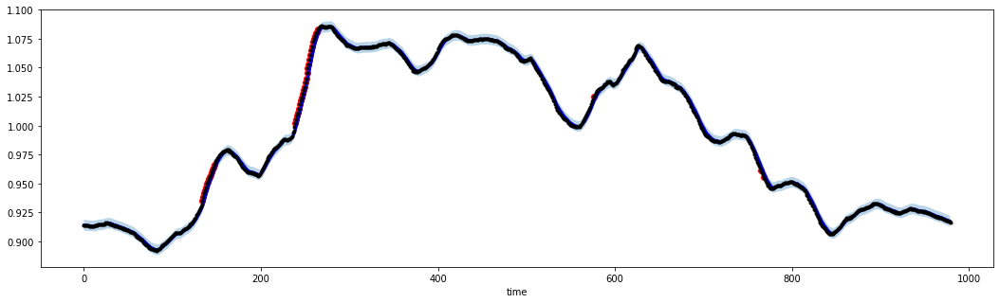

In [ ]:
subset_loss_lstm = data_loss.to_numpy()[:NUM_SUBSET,0]
# operate smoothing
smoother = ExponentialSmoother(window_len=20, alpha=0.3)
smoother.smooth(subset_loss_lstm)

# generate intervals
low, up = smoother.get_intervals('sigma_interval', n_sigma=2)

# plot the smoothed timeseries with intervals
plt.figure(figsize=(18,5))
plt.plot(smoother.smooth_data[0], linewidth=3, color='blue')
plt.plot(smoother.data[0], '.k')
plt.xlabel('time')

plt.fill_between(range(len(smoother.data[0])), low[0], up[0], alpha=0.3)
abn_x = np.array(range(len(smoother.data[0])))[(smoother.data[0] < low[0]) | (smoother.data[0] > up[0])]
abn_y = smoother.data[0][(smoother.data[0] < low[0]) | (smoother.data[0] > up[0])]
plt.scatter(abn_x, abn_y, c='red', alpha=1.)

In [ ]:
test_score_df['Anomaly_DT_LSTM'] = False
test_score_df.iloc[abn_x, [-1]] = True

## GRU with autoencoder

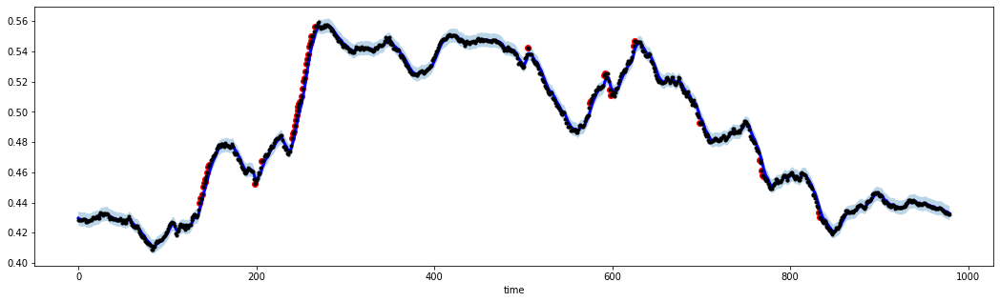

In [ ]:
subset_loss_gru = data_loss.to_numpy()[:NUM_SUBSET,1]
# operate smoothing
smoother = ExponentialSmoother(window_len=20, alpha=0.3)
smoother.smooth(subset_loss_gru)

# generate intervals
low, up = smoother.get_intervals('sigma_interval', n_sigma=2)

# plot the smoothed timeseries with intervals
plt.figure(figsize=(18,5))
plt.plot(smoother.smooth_data[0], linewidth=3, color='blue')
plt.plot(smoother.data[0], '.k')
plt.xlabel('time')

plt.fill_between(range(len(smoother.data[0])), low[0], up[0], alpha=0.3)
abn_x = np.array(range(len(smoother.data[0])))[(smoother.data[0] < low[0]) | (smoother.data[0] > up[0])]
abn_y = smoother.data[0][(smoother.data[0] < low[0]) | (smoother.data[0] > up[0])]
plt.scatter(abn_x, abn_y, c='red', alpha=1.)

In [ ]:
test_score_df['Anomaly_DT_GRU'] = False
test_score_df.iloc[abn_x, [-1]] = True

## Variational Autoencder

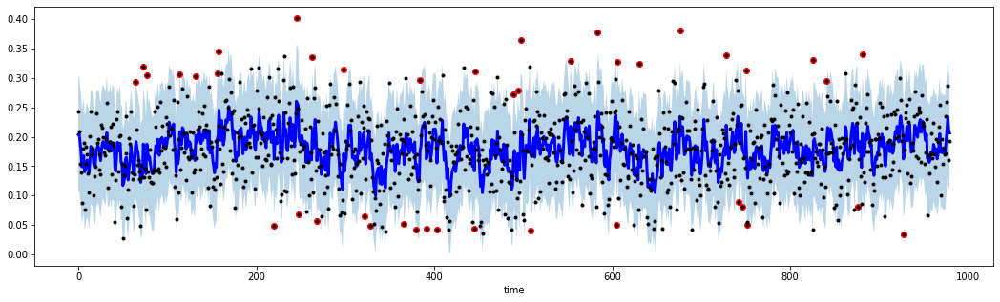

In [ ]:
subset_loss_vae = data_loss.to_numpy()[:NUM_SUBSET,2]
# operate smoothing
smoother = ExponentialSmoother(window_len=20, alpha=0.3)
smoother.smooth(subset_loss_vae)

# generate intervals
low, up = smoother.get_intervals('sigma_interval', n_sigma=2)

# plot the smoothed timeseries with intervals
plt.figure(figsize=(18,5))
plt.plot(smoother.smooth_data[0], linewidth=3, color='blue')
plt.plot(smoother.data[0], '.k')
plt.xlabel('time')

plt.fill_between(range(len(smoother.data[0])), low[0], up[0], alpha=0.3)
abn_x = np.array(range(len(smoother.data[0])))[(smoother.data[0] < low[0]) | (smoother.data[0] > up[0])]
abn_y = smoother.data[0][(smoother.data[0] < low[0]) | (smoother.data[0] > up[0])]
plt.scatter(abn_x, abn_y, c='red', alpha=1.)

In [ ]:
test_score_df['Anomaly_DT_VAE'] = False
test_score_df.iloc[abn_x, [-1]] = True

# Plot and compare results among models

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df.iloc[:NUM_SUBSET]['Datetime'], y=test_score_df.iloc[:NUM_SUBSET]['Close'], name='Test Close'))
fig.add_trace(go.Scatter(x=test_score_df[test_score_df['Anomaly_DT_LSTM'] == True]['Datetime'], y=test_score_df[test_score_df['Anomaly_DT_LSTM'] == True]['Close'], 
                         name='Anomaly by LSTM with autoencder using dynamic threshold', mode='markers'))
fig.update_layout(showlegend=True, title='Test Close vs. Thresholds computed by LSTM with autoencder')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df.iloc[:NUM_SUBSET]['Datetime'], y=test_score_df.iloc[:NUM_SUBSET]['Close'], name='Test Close'))
fig.add_trace(go.Scatter(x=test_score_df[test_score_df['Anomaly_DT_GRU'] == True]['Datetime'], y=test_score_df[test_score_df['Anomaly_DT_GRU'] == True]['Close'], 
                         name='Anomaly by GRU with autoencder using dynamic threshold', mode='markers'))
fig.update_layout(showlegend=True, title='Test Close vs. Dynamic Threshold computed by GRU with autoencder')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df.iloc[:NUM_SUBSET]['Datetime'], y=test_score_df.iloc[:NUM_SUBSET]['Close'], name='Test Close'))
fig.add_trace(go.Scatter(x=test_score_df[test_score_df['Anomaly_DT_VAE'] == True]['Datetime'], y=test_score_df[test_score_df['Anomaly_DT_VAE'] == True]['Close'], 
                         name='Anomaly by Variational autoencder using dynamic threshold', mode='markers'))
fig.update_layout(showlegend=True, title='Test Close vs. Dynamic Threshold computed by Variational autoencder')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df.iloc[:NUM_SUBSET]['Datetime'], y=test_score_df.iloc[:NUM_SUBSET]['Close'], name='Test Close'))
fig.add_trace(go.Scatter(x=test_score_df[test_score_df['Anomaly_DT_LSTM'] == True]['Datetime'], y=test_score_df[test_score_df['Anomaly_DT_LSTM'] == True]['Close'], 
                         name='Anomaly by LSTM with autoencder using dynamic threshold', mode='markers'))
fig.add_trace(go.Scatter(x=test_score_df[test_score_df['Anomaly_DT_GRU'] == True]['Datetime'], y=test_score_df[test_score_df['Anomaly_DT_GRU'] == True]['Close'], 
                         name='Anomaly by GRU with autoencder using dynamic threshold', mode='markers'))
fig.add_trace(go.Scatter(x=test_score_df[test_score_df['Anomaly_DT_VAE'] == True]['Datetime'], y=test_score_df[test_score_df['Anomaly_DT_VAE'] == True]['Close'], 
                         name='Anomaly by Variational autoencder using dynamic threshold', mode='markers'))
fig.update_layout(showlegend=True, title='First 1000 Test Close vs. Dynamic Thresholds')
fig.show()